In [1]:
import numpy as np
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import time
from IPython.display import display
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from collections import defaultdict, Counter
from sklearn.metrics import adjusted_mutual_info_score, accuracy_score, homogeneity_score, silhouette_score,adjusted_rand_score,completeness_score,v_measure_score,fowlkes_mallows_score
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
import sys
import warnings
from sklearn.decomposition import FastICA
from sklearn.mixture import GaussianMixture as GMM
from sklearn.decomposition import PCA
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer,InterclusterDistance
from sklearn.datasets import make_blobs
from scipy.stats import norm, kurtosis
#from silhouette import silhouette
from itertools import product
from sklearn.random_projection import SparseRandomProjection as RCA
import scipy.sparse as sps
from scipy.linalg import pinv
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestClassifier
from sklearn.random_projection import GaussianRandomProjection
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
matplotlib.rc('figure', figsize=[10,5])

# Read dataset

In [2]:
sat = pd.read_csv('Satisfaction.csv')
print(sat.dtypes)
print(f'unique Value of our Target_class:  {sat.satisfaction.unique()}')

Unnamed: 0                             int64
id                                     int64
Gender                                object
Customer_Type                         object
Age                                    int64
Type_of_Travel                        object
Class                                 object
Flight_Distance                        int64
Inflight_wifi_service                  int64
Departure_Arrival_time_convenient      int64
Ease_of_Online_booking                 int64
Gate_location                          int64
Food_and_drink                         int64
Online_boarding                        int64
Seat_comfort                           int64
Inflight_entertainment                 int64
On_board_service                       int64
Leg_room_service                       int64
Baggage_handling                       int64
Checkin_service                        int64
Inflight_service                       int64
Cleanliness                            int64
Departure_

# Pre-process

In [3]:
sat.isnull().sum()

Unnamed: 0                            0
id                                    0
Gender                                0
Customer_Type                         0
Age                                   0
Type_of_Travel                        0
Class                                 0
Flight_Distance                       0
Inflight_wifi_service                 0
Departure_Arrival_time_convenient     0
Ease_of_Online_booking                0
Gate_location                         0
Food_and_drink                        0
Online_boarding                       0
Seat_comfort                          0
Inflight_entertainment                0
On_board_service                      0
Leg_room_service                      0
Baggage_handling                      0
Checkin_service                       0
Inflight_service                      0
Cleanliness                           0
Departure_Delay_in_Minutes            0
Arrival_Delay_in_Minutes             83
satisfaction                          0


In [4]:
sat.dropna(inplace=True)

<AxesSubplot:>

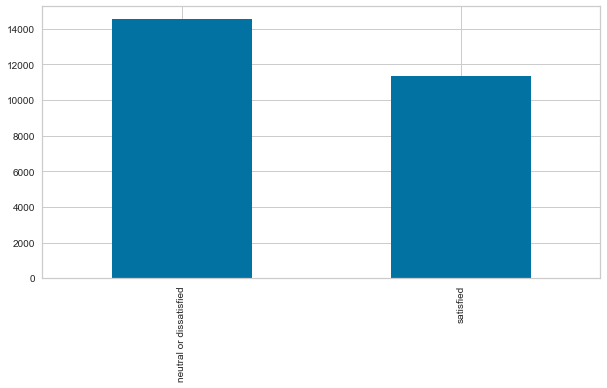

In [5]:
sat['satisfaction'].value_counts().plot(kind='bar')

In [6]:
sat['satisfaction'] = sat['satisfaction'].map({'neutral or dissatisfied': 0,'satisfied': 1})

Random under-sampling:
0    11365
1    11365
Name: satisfaction, dtype: int64


<AxesSubplot:title={'center':'Count (satisfaction)'}>

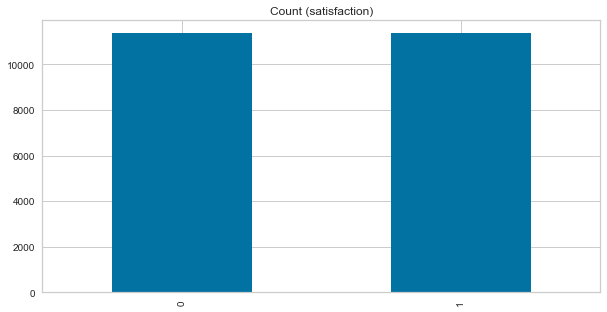

In [7]:
count_class_0, count_class_1 = sat['satisfaction'].value_counts()
class_0 = sat[sat['satisfaction'] == 0]
class_1 = sat[sat['satisfaction'] == 1]

class_0_under = class_0.sample(count_class_1, random_state = 7)

data_under = pd.concat([class_0_under, class_1], axis=0)

print('Random under-sampling:')
print(data_under.satisfaction.value_counts())

data_under.satisfaction.value_counts().plot(kind='bar', title='Count (satisfaction)')

In [8]:
data_under.columns

Index(['Unnamed: 0', 'id', 'Gender', 'Customer_Type', 'Age', 'Type_of_Travel',
       'Class', 'Flight_Distance', 'Inflight_wifi_service',
       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction'],
      dtype='object')

In [9]:
data_under = data_under.drop(columns = ['Unnamed: 0','id'])

In [10]:
numerical_features = data_under.select_dtypes(include=['float64','int64']).columns.tolist()
numerical_features.remove('satisfaction')
categorical_features = data_under.select_dtypes(exclude=['float64','int64']).columns.tolist()

In [11]:
numerical_features

['Age',
 'Flight_Distance',
 'Inflight_wifi_service',
 'Departure_Arrival_time_convenient',
 'Ease_of_Online_booking',
 'Gate_location',
 'Food_and_drink',
 'Online_boarding',
 'Seat_comfort',
 'Inflight_entertainment',
 'On_board_service',
 'Leg_room_service',
 'Baggage_handling',
 'Checkin_service',
 'Inflight_service',
 'Cleanliness',
 'Departure_Delay_in_Minutes',
 'Arrival_Delay_in_Minutes']

In [12]:
categorical_features

['Gender', 'Customer_Type', 'Type_of_Travel', 'Class']

In [13]:
len(numerical_features)

18

In [14]:
len(categorical_features)

4

In [15]:
data_under['Gender'] =data_under['Gender'].map({'Female': 0,'Male': 1})

In [16]:
data_under['Customer_Type'] = data_under['Customer_Type'].map({'disloyal Customer': 0,'Loyal Customer': 1})

In [17]:
data_under['Type_of_Travel'] = data_under['Type_of_Travel'].map({'Personal Travel': 0,'Business travel': 1})

In [18]:
data_under['Class'] = data_under['Class'].map({'Eco': 0,'Business': 1, 'Eco Plus': 2})

In [19]:
data_under.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22730 entries, 5327 to 25974
Data columns (total 23 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             22730 non-null  int64  
 1   Customer_Type                      22730 non-null  int64  
 2   Age                                22730 non-null  int64  
 3   Type_of_Travel                     22730 non-null  int64  
 4   Class                              22730 non-null  int64  
 5   Flight_Distance                    22730 non-null  int64  
 6   Inflight_wifi_service              22730 non-null  int64  
 7   Departure_Arrival_time_convenient  22730 non-null  int64  
 8   Ease_of_Online_booking             22730 non-null  int64  
 9   Gate_location                      22730 non-null  int64  
 10  Food_and_drink                     22730 non-null  int64  
 11  Online_boarding                    22730 non-null  

## Scaling and splitting

In [20]:
data_under.head()

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure_Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On_board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
5327,0,1,25,1,1,3056,3,5,5,5,3,3,3,3,3,4,3,2,4,3,15,47.0,0
21395,0,1,46,1,0,2075,4,1,1,1,1,3,4,4,4,4,4,2,4,3,2,0.0,0
5443,1,1,64,0,0,446,4,5,4,4,1,4,2,1,3,3,5,3,4,1,32,29.0,0
11953,0,1,65,0,0,1589,2,4,2,1,5,5,5,1,1,2,1,5,1,4,0,4.0,0
6649,0,1,57,0,0,991,4,2,4,4,2,4,3,5,5,4,5,2,5,2,4,0.0,0


In [21]:
X = data_under.drop('satisfaction', axis=1)
y = data_under["satisfaction"]
X_train_n, X_test_n, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 7)

minMaxNorm = MinMaxScaler()
X_train = minMaxNorm.fit_transform(X_train_n)
X_test = minMaxNorm.fit_transform(X_test_n)

In [22]:
#predictors_list = ['Gender', 'Customer_Type', 'Age', 'Type_of_Travel',
#       'Class', 'Flight_Distance', 'Inflight_wifi_service',
#       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
#       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
#       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
#       'Baggage_handling', 'Checkin_service', 'Inflight_service',
#       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes'
#        ]

#target = data_under['satisfaction']
#result_X = data_under[predictors_list]
#print(result_X.shape)
#min_max_scaler = preprocessing.MinMaxScaler()
#result_X_scaled = min_max_scaler.fit_transform(result_X)

#print(result_X_scaled.shape)
#data_under_scaled = pd.DataFrame(result_X_scaled, columns=predictors_list)
#data_under_scaled['satisfaction'] = target
#data_under_scaled.head()

In [23]:
#data_under_scaled["Arrival_Delay_in_Minutes"] = data_under_scaled["Arrival_Delay_in_Minutes"].astype(np.int64)

In [24]:
#data_under_scaled.info()

In [25]:
X_train.shape

(15911, 22)

In [26]:
LABELS = ['Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
        ]

# K-means

## Elbow

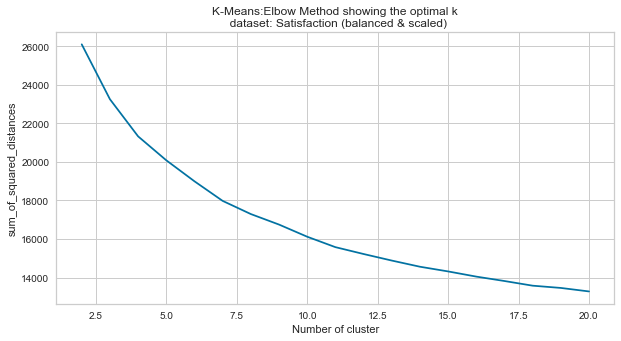

In [27]:
sse = {}
clust_range = list(range(2,21,1))
for cluster_size in clust_range:
    kmeans = KMeans(n_clusters=cluster_size, max_iter=10000, random_state=7).fit(X_train)
    sse [cluster_size] = kmeans.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel('sum_of_squared_distances')
plt.title('K-Means:Elbow Method showing the optimal k\n  dataset: Satisfaction (balanced & scaled)')
plt.show()

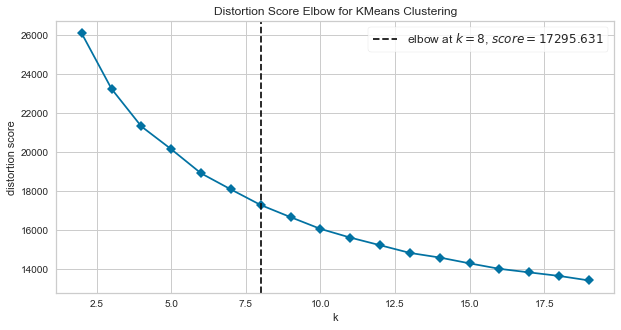

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [89]:
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,20), timings=False)
visualizer.fit(X_train)        
visualizer.show()     

In [90]:
kmeans = KMeans(n_clusters=8, max_iter=10000, random_state=7).fit(X_train)
print(f'adjusted_mutual_info_score based on 8 clusters :{adjusted_mutual_info_score((kmeans.labels_), y_train)}')
print(f'adjusted rand index based on 8 clusters :{adjusted_rand_score((kmeans.labels_), y_train)}')
print(f'homogeneity_score based on 8 clusters :{homogeneity_score((kmeans.labels_), y_train)}')
print(f'completeness_score based on 8 clusters :{completeness_score((kmeans.labels_), y_train)}')
print(f'v_measure_score based on 8 clusters :{v_measure_score((kmeans.labels_), y_train)}')
print(f'fowlkes_mallows_score based on 8 clusters :{fowlkes_mallows_score((kmeans.labels_), y_train)}')


adjusted_mutual_info_score based on 8 clusters :0.20765914347999656
adjusted rand index based on 8 clusters :0.1286356920583904
homogeneity_score based on 8 clusters :0.1388122291481437
completeness_score based on 8 clusters :0.41299703178644964
v_measure_score based on 8 clusters :0.2077857066651845
fowlkes_mallows_score based on 8 clusters :0.3807526721080458


## Metrics

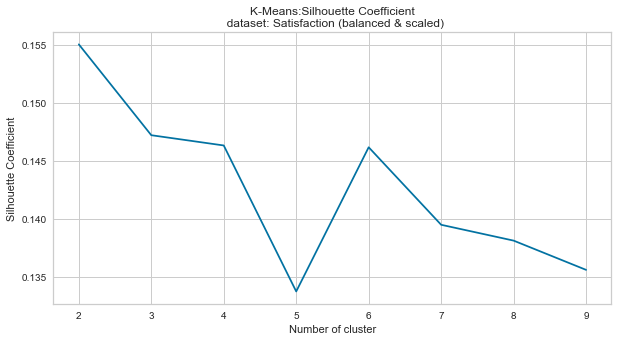

In [27]:
silh = {}
homog = {}
for cluster_size in range(2,10):
    kmeans = KMeans(n_clusters=cluster_size, max_iter=10000, random_state=7).fit(X_train)
    label = kmeans.labels_
    sil_coeff = silhouette_score(X_train, label, metric='euclidean')
    homog_score = homogeneity_score(y_train, label)
    silh[cluster_size] = sil_coeff
    homog[cluster_size] = homog_score
plt.figure()
plt.plot(list(silh.keys()), list(silh.values()),'bx-' )
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Coefficient")
plt.title('K-Means:Silhouette Coefficient\n  dataset: Satisfaction (balanced & scaled)')
plt.show()

In [28]:
def get_kmean_scores(X, y, N):


    def get_kmean(n):
        km = KMeans(n_clusters=n,random_state=7, max_iter=10000)
        km.fit(X)
        km_labels = km.predict(X)
        
        hom = homogeneity_score(y, km_labels)
        ami = adjusted_mutual_info_score(y,km_labels)
        rand = adjusted_rand_score(y,km_labels)
        comple = completeness_score(y,km_labels)
        vmeasure = v_measure_score(y,km_labels)
        fowm = fowlkes_mallows_score(y, km_labels)
        
        
        return hom, ami, rand, comple, vmeasure, fowm 
    
  
    
    n_rng = np.arange(2,N+1)
    scores_df = pd.DataFrame()

    for n in n_rng:
        results = {'n':n}
        hom, ami, rand, comple, vmeasure, fowm  = get_kmean(n)            
        results[f"hom"] = hom; results[f"ami"] = ami; results[ f"rand"] = rand; results[f"comple"] = comple; results[f"vmeasure"] = vmeasure; results[f"fowm"] = fowm 
        print(f" done with N: {n}")
        
        scores_df = scores_df.append(results, ignore_index=True)
            

    return scores_df

In [29]:
def plot_elbow_kmeans(k_metric_df, name='dsname'):
    
    #fig = plt.figure(figsize=[2,3])

    plt.figure()
    
    x_vals = k_metric_df['n'].values
    x_vals = x_vals.astype('int32')
    
    plt.plot(x_vals, k_metric_df['hom'], label="Homogeneity")
    plt.plot(x_vals, k_metric_df['ami'], label="AMI")
    plt.plot(x_vals, k_metric_df['rand'], label="Rand index")
    plt.plot(x_vals, k_metric_df['comple'], label="Completeness")
    plt.plot(x_vals, k_metric_df['vmeasure'], label="V-measure")
    plt.plot(x_vals, k_metric_df['fowm'], label="Fowlkes-Mallows")

    plt.legend()
    plt.xlabel("Number of cluster")
    plt.ylabel("scores")
    plt.title('K-Means:other performance evaluation\n dataset: %s '%name)
    plt.show()

In [30]:
scores_df = get_kmean_scores(X_train, y_train, 10)

 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10


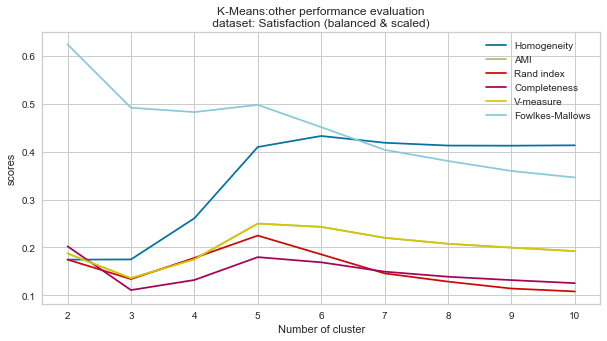

In [31]:
plot_elbow_kmeans(scores_df, 'Satisfaction (balanced & scaled)')

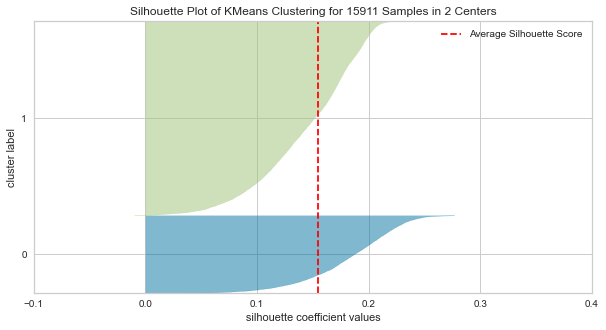

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 15911 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [96]:
#2
model = KMeans(2, random_state=7)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(X_train)        
visualizer.show()   

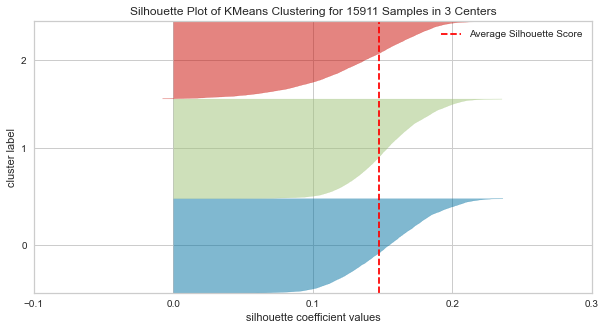

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 15911 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [97]:
#3
model = KMeans(3, random_state=7)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(X_train)        
visualizer.show()  

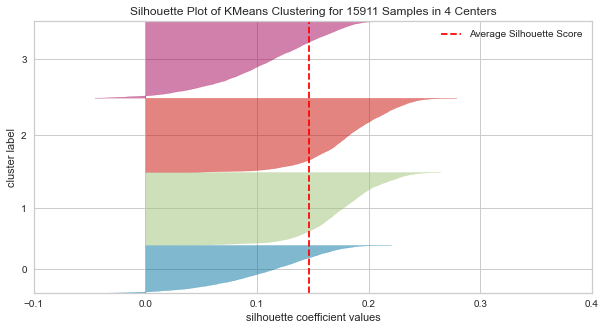

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 15911 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [98]:
#4
model = KMeans(4, random_state=7)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(X_train)        
visualizer.show()  

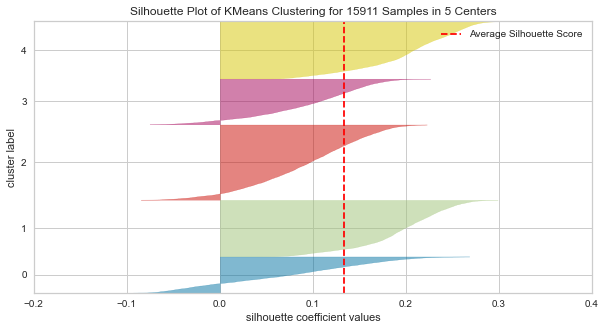

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 15911 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [99]:
#5
model = KMeans(5, random_state=7)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(X_train)        
visualizer.show()  

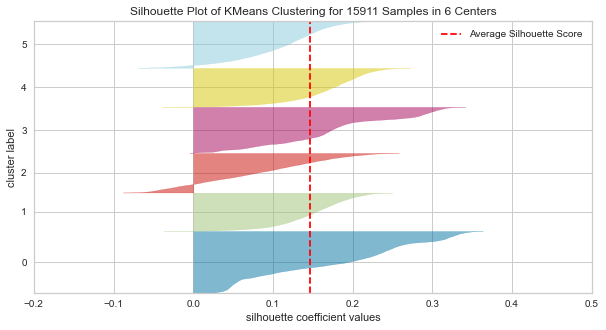

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 15911 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [100]:
#6
model = KMeans(6, random_state=7)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(X_train)        
visualizer.show()  

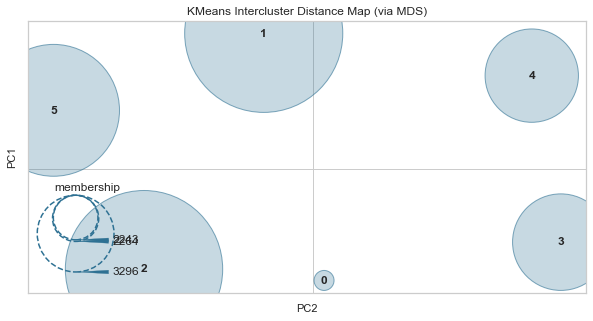

<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [101]:
model = KMeans(6)
visualizer = InterclusterDistance(model, random_state=7)
visualizer.fit(X_train)       
visualizer.show()   

In [102]:
kmeans = KMeans(n_clusters=5, max_iter=10000, random_state=6).fit(X_train)
print(f'adjusted_mutual_info_score based on 6 clusters :{adjusted_mutual_info_score((kmeans.labels_), y_train)}')
print(f'adjusted rand index based on 6 clusters :{adjusted_rand_score((kmeans.labels_), y_train)}')
print(f'homogeneity_score based on 6 clusters :{homogeneity_score((kmeans.labels_), y_train)}')
print(f'completeness_score based on 6 clusters :{completeness_score((kmeans.labels_), y_train)}')
print(f'v_measure_score based on 6 clusters :{v_measure_score((kmeans.labels_), y_train)}')
print(f'fowlkes_mallows_score based on 6 clusters :{fowlkes_mallows_score((kmeans.labels_), y_train)}')

adjusted_mutual_info_score based on 6 clusters :0.2490143802641522
adjusted rand index based on 6 clusters :0.22421219255208213
homogeneity_score based on 6 clusters :0.17915866779813336
completeness_score based on 6 clusters :0.4086065089884668
v_measure_score based on 6 clusters :0.24909743106675541
fowlkes_mallows_score based on 6 clusters :0.49757344997336833


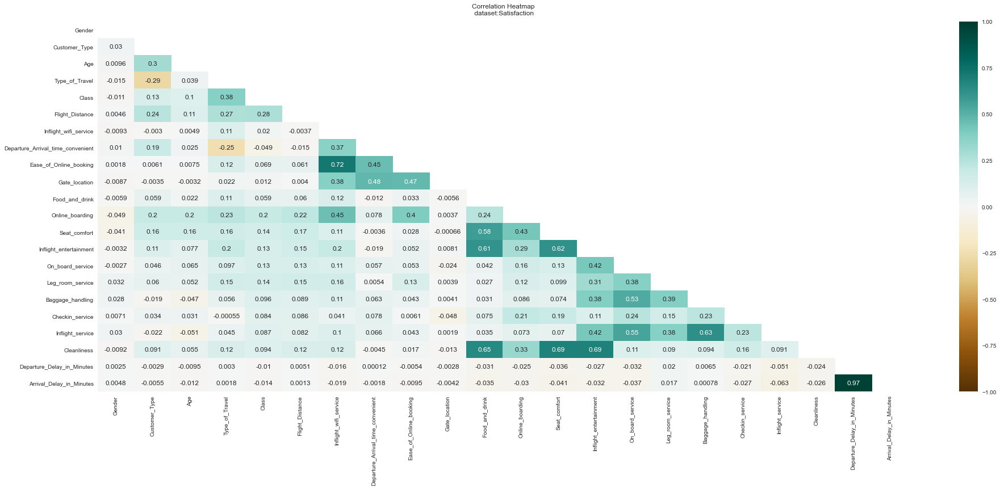

In [32]:
##Point Biserial Correlation
from scipy import stats
pair_corr = pd.DataFrame(X_train, columns=['Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',])


num_corr=pair_corr.corr()
plt.figure(figsize=(32, 12))
mask = np.triu(np.ones_like(num_corr, dtype=np.bool))
num_heatmap = sns.heatmap(num_corr, mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
num_heatmap.set_title('Correlation Heatmap\n dataset:Satisfaction', fontdict={'fontsize':12}, pad=12);

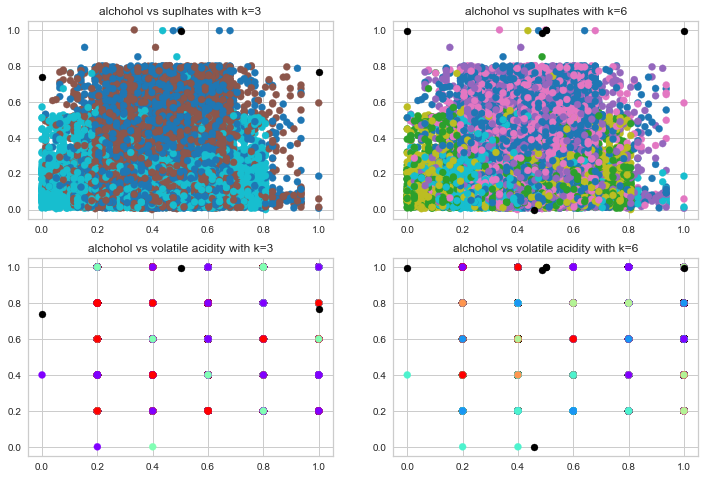

In [33]:
fig=plt.gcf() 
fig.set_size_inches(12,8) 
count = 1

for optimal_k in [3, 6]:
  kmeans = KMeans(init='k-means++', n_clusters=optimal_k, random_state=7).fit(X_train)
  plt.subplot(2, 2, count)  
  plt.title("alchohol vs suplhates with k=" + str(optimal_k))
  plt.scatter(X_train[:,2], X_train[:,5], c=kmeans.labels_, cmap='tab10')    
  plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1], color='black') 
 
  plt.subplot(2, 2, count+2)
  plt.title("alchohol vs volatile acidity with k=" + str(optimal_k))
  plt.scatter(X_train[:,-3], X_train[:,14], c=kmeans.labels_, cmap='rainbow')    
  plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1], color='black') 
 
  count += 1

plt.show()

Text(0.5, 1.08, 'Kmeans: pairwise plotting, k-cluster = 3\n dataset: Satisfaction')

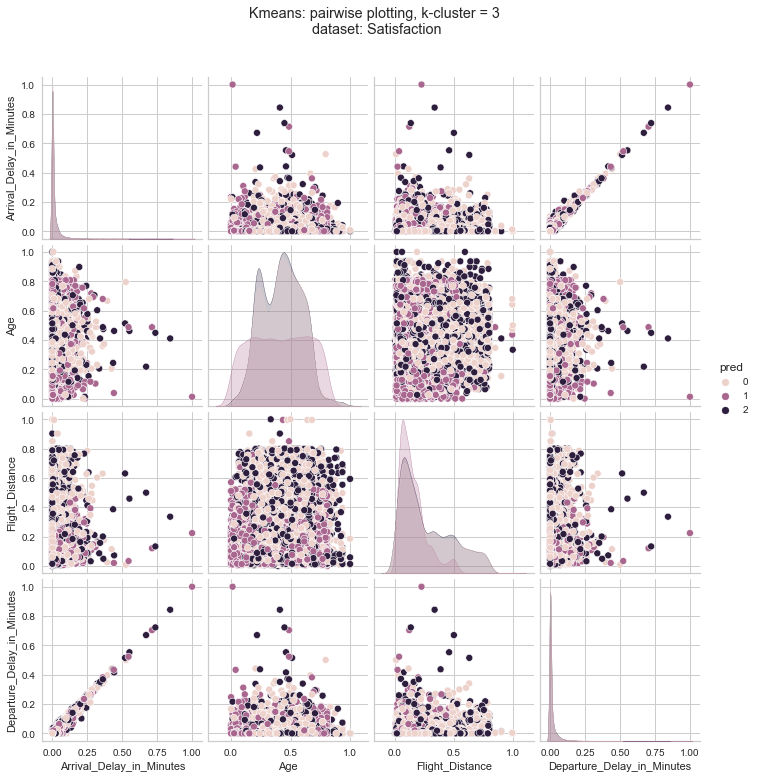

In [187]:
#Kmeans Pairwise
pair_df = pd.DataFrame(X_train, columns=['Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',])

km = KMeans(n_clusters=3,random_state=7, max_iter=10000)
km.fit(X_train)
labels = km.labels_
pred_clusters = km.predict(X_train)
pred_clusters.shape

filtred_df = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)

filtred_df['pred'] = labels #pred_mal_clusters
ax = sns.pairplot(filtred_df, hue="pred")
ax.fig.suptitle("Kmeans: pairwise plotting, k-cluster = 3\n dataset: Satisfaction", y=1.08)


# EM

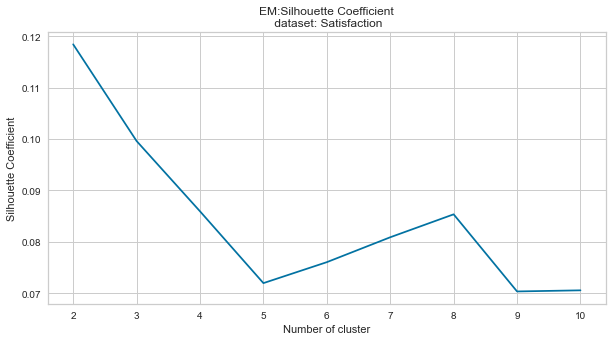

In [103]:
# Churn dataset on EM
silh_em = {}
homog_em = {}
ll_em = {}
for cluster in range(2,11):
    gmm = GaussianMixture(n_components=cluster, max_iter=10000, random_state=7, 
                          n_init=5).fit(X_train)
    label = gmm.predict(X_train)
    sil_coeff = silhouette_score(X_train, label, metric='euclidean')
    homog_score = homogeneity_score(y_train, label)
    silh_em[cluster] = sil_coeff
    homog_em[cluster] = homog_score
    ll_em[cluster] = gmm.score(X_test)
plt.figure()
plt.plot(list(silh_em.keys()), list(silh_em.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Coefficient")
plt.title("EM:Silhouette Coefficient\n dataset: Satisfaction")
plt.show()

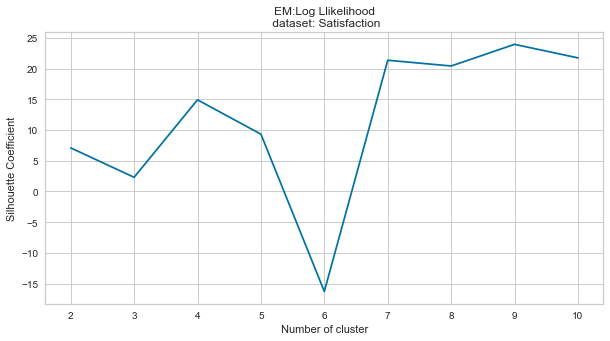

In [104]:
plt.figure()
plt.plot(list(ll_em.keys()), list(ll_em.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Coefficient")
plt.title("EM:Log Llikelihood\n dataset: Satisfaction")
plt.show()

In [27]:
def get_em_results_names():
    cv_types = ["spherical", "tied", "diag", "full"]
    score_types = ["sil","bic","hom", "fowm", "ami"]
    names = [f"{sc}_{cv}" for sc in score_types for cv in cv_types] 
    return names



def get_em_scores(X, y, N):


    def get_em(n, cv_t):
        gmm = GMM(n_components=n, covariance_type=cv_t, warm_start=True, random_state=7)
        gmm.fit(X)
        gmm_labels = gmm.predict(X)

        ss = silhouette_score(X, gmm_labels, metric='euclidean')
        bic = gmm.bic(X)
        hom = homogeneity_score(y, gmm_labels)
        fowm = fowlkes_mallows_score(y, gmm_labels)
        ami = adjusted_mutual_info_score(y,gmm_labels)
        return ss, bic, hom, fowm, ami
    
    cv_types = ["spherical", "tied", "diag", "full"]
        
    
    n_rng = np.arange(2,N+1)
    
    names =['n'] + get_em_results_names()

    scores_df = pd.DataFrame(columns=names)

    for n in n_rng:
        results = {'n':n}
        for cv_t in cv_types:
            ss_em, bic, hom, fowm, ami = get_em(n,cv_t)            
            results[ f"sil_{cv_t}"] =  ss_em; results[f"bic_{cv_t}"] = bic ; results[f"hom_{cv_t}"] = hom; results[f"fowm_{cv_t}"] = fowm; results[f"ami_{cv_t}"] = ami
        print(f" done with N: {n}")
        
        scores_df = scores_df.append(results, ignore_index=True)
            

    return scores_df

In [28]:
def plot_elbow_em(k_metric_df, name='dsname', face_color=None):
    
    figsave=False
    
    
    fig = plt.figure(figsize=[20,5])
    ax1 = fig.add_subplot(151)
    ax2 = fig.add_subplot(152)
    ax3 = fig.add_subplot(153)
    ax4 = fig.add_subplot(154)
    ax5 = fig.add_subplot(155)
    allAxs = [ax1, ax2, ax3, ax4, ax5] 

    
    x_vals = k_metric_df['n'].values
    x_vals = x_vals.astype('int32')

    for cv_t in ["spherical", "tied", "diag", "full"]:
        
        ax1.plot(x_vals, k_metric_df['sil_'+cv_t], label=f"{cv_t}")
        ax2.plot(x_vals, k_metric_df['bic_'+cv_t], label=f"{cv_t}")
        ax3.plot(x_vals, k_metric_df['hom_'+cv_t], label=f"{cv_t}")
        ax4.plot(x_vals, k_metric_df['fowm_'+cv_t], label=f"{cv_t}")
        ax5.plot(x_vals, k_metric_df['ami_'+cv_t], label=f"{cv_t}")
   
    ax1.set_xticks(x_vals); ax2.set_xticks(x_vals); ax3.set_xticks(x_vals); ax4.set_xticks(x_vals);ax5.set_xticks(x_vals)
    
    if face_color != None:
        for ax in allAxs:
            ax.set_facecolor(face_color)

    ax1.legend(); ax1.set_ylabel("Silhouette Score"); ax1.set_xlabel("Number of cluster");ax1.grid(True)
    ax2.legend(); ax2.set_ylabel("Bic Score"); ax2.set_xlabel("Number of cluster");ax2.grid(True)
    ax3.legend(); ax3.set_ylabel("Homogeneity Score"); ax3.set_xlabel("Number of cluster"); ax3.grid(True)
    ax4.legend(); ax4.set_ylabel("Fowlkes-Mallows Score"); ax4.set_xlabel("Number of cluster"); ax4.grid(True)
    ax5.legend(); ax5.set_ylabel("AMI Score"); ax5.set_xlabel("Number of cluster"); ax5.grid(True)

    ax1.set_title('EM: Elbow silhouette score\n  dataset: %s '%name)
    ax2.set_title('EM: BIC score\n  dataset: %s '%name)
    ax3.set_title('EM: Homogeneity score\n  dataset: %s '%name)
    ax4.set_title('EM: Fowlkes-Mallows score\n  dataset: %s '%name)
    ax5.set_title('EM: Ajusted Mutual Information score\n  dataset: %s '%name)



    fig.tight_layout()
    plt.show()

    #if figsave:
    #    fig.savefig('plots/em_cov_%s_results.png'%short_name, bbox_inches='tight')
    #    plt.close(fig=fig)
    #else:
    #    plt.show()

In [107]:
scores_x = get_em_scores(X_train, y_train, 10)

 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10


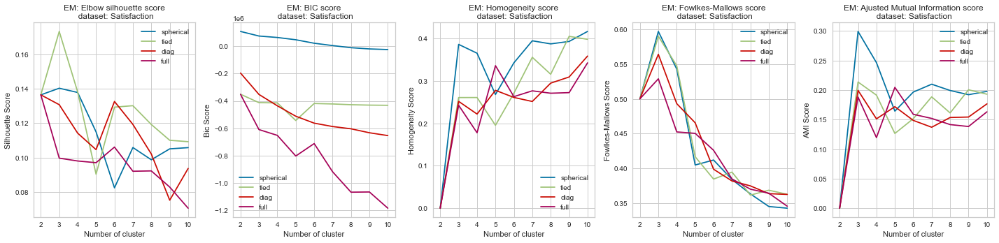

In [108]:
plot_elbow_em(scores_x, 'Satisfaction')

In [111]:
kmeans = KMeans(n_clusters=5, max_iter=10000, random_state=3).fit(X_train)
print(f'adjusted_mutual_info_score based on 3 clusters :{adjusted_mutual_info_score((kmeans.labels_), y_train)}')
print(f'adjusted rand index based on 3 clusters :{adjusted_rand_score((kmeans.labels_), y_train)}')
print(f'homogeneity_score based on 3 clusters :{homogeneity_score((kmeans.labels_), y_train)}')
print(f'completeness_score based on 3 clusters :{completeness_score((kmeans.labels_), y_train)}')
print(f'v_measure_score based on 3 clusters :{v_measure_score((kmeans.labels_), y_train)}')
print(f'fowlkes_mallows_score based on 3 clusters :{fowlkes_mallows_score((kmeans.labels_), y_train)}')

adjusted_mutual_info_score based on 3 clusters :0.2498324500560579
adjusted rand index based on 3 clusters :0.22476356847567733
homogeneity_score based on 3 clusters :0.17975034984600152
completeness_score based on 3 clusters :0.4099307929449677
v_measure_score based on 3 clusters :0.24991541393287106
fowlkes_mallows_score based on 3 clusters :0.49801118296588603


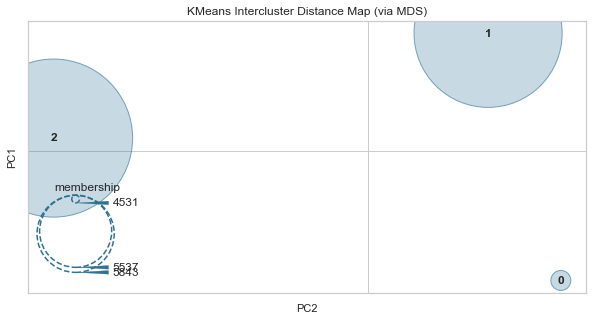

<AxesSubplot:title={'center':'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [112]:
model = KMeans(3)
visualizer = InterclusterDistance(model, random_state=7)
visualizer.fit(X_train)       
visualizer.show()   

Text(0.5, 1.08, 'EM: pairwise plotting, k-cluster = 3\n dataset: Satisfaction')

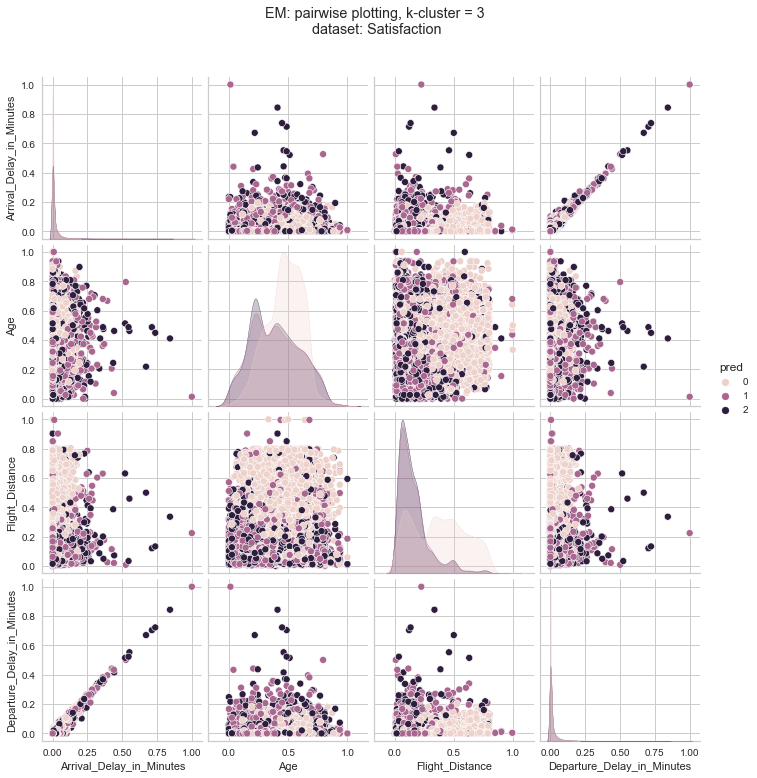

In [192]:
#em Pairwise
#pair_df = pd.DataFrame(X_train, columns=['Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
#       'Flight_Distance', 'Inflight_wifi_service',
#       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
#       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
#       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
#       'Baggage_handling', 'Checkin_service', 'Inflight_service',
#       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',])

gmm = GMM(n_components=3, covariance_type='full', random_state=998756)
gmm.fit(X_train)
#labels2 = gmm.labels_

pred_clusters = gmm.predict(X_train)


filtred_df2 = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)

filtred_df2['pred'] = pred_clusters #pred_mal_clusters
ax = sns.pairplot(filtred_df2, hue="pred")
ax.fig.suptitle("EM: pairwise plotting, k-cluster = 3\n dataset: Satisfaction", y=1.08)


# Feature Reduction

## PCA

In [109]:
pca = PCA(random_state=7)
pca.fit(X_train)
pca_ind = pca.explained_variance_ratio_
print(pca_ind)

[1.74914235e-01 1.33473402e-01 1.27610880e-01 1.09542840e-01
 8.69938301e-02 7.28827375e-02 4.84262744e-02 4.18425317e-02
 3.07683886e-02 2.49397943e-02 2.23617092e-02 2.08352022e-02
 1.84801266e-02 1.69398153e-02 1.47513316e-02 1.29235263e-02
 1.23427626e-02 1.17285728e-02 1.03311862e-02 6.63172656e-03
 1.25927410e-03 1.98530571e-05]


In [117]:
pca_cumsum = pca.explained_variance_ratio_.cumsum()
print(pca_cumsum)

[0.17491423 0.30838764 0.43599852 0.54554136 0.63253519 0.70541792
 0.7538442  0.79568673 0.82645512 0.85139491 0.87375662 0.89459182
 0.91307195 0.93001177 0.9447631  0.95768662 0.97002939 0.98175796
 0.99208915 0.99872087 0.99998015 1.        ]


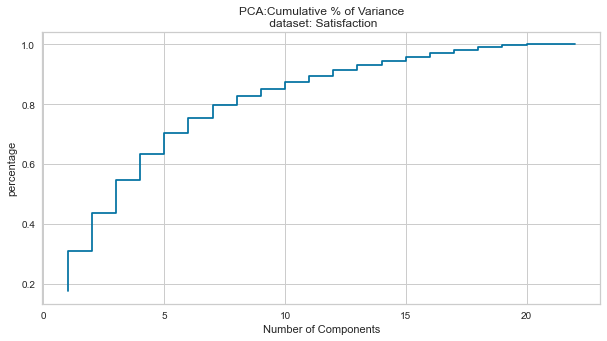

In [120]:
plt.figure()
plt.step(range(1, 23),pca_cumsum)
plt.xlabel("Number of Components")
plt.ylabel("percentage")
plt.title("PCA:Cumulative % of Variance\n dataset: Satisfaction")
plt.show()

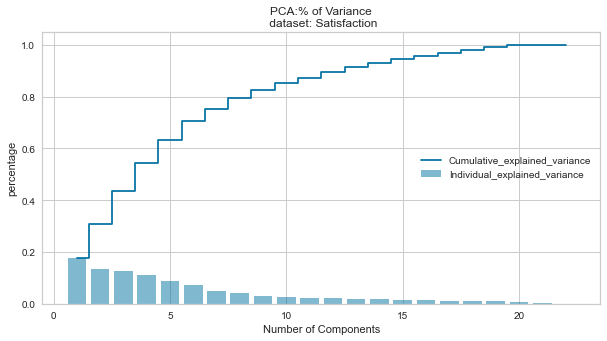

In [121]:
plt.bar(range(1, 23), pca_ind, alpha=0.5, align='center', label='Individual_explained_variance')  
plt.step(range(1, 23), pca_cumsum, where='mid', label='Cumulative_explained_variance') 
plt.ylabel("percentage")
plt.xlabel("Number of Components")
plt.title("PCA:% of Variance\n dataset: Satisfaction")
plt.legend(loc='right')
plt.show()

In [122]:
pca.explained_variance_ratio_[:12
                             ].sum()

0.8945918247865398

In [123]:
pca1 = PCA(n_components=13,random_state=7)
pca1.fit(X_train)
pca_X =pca1.transform(X_train)

In [124]:
import seaborn as sns

def plot_pca(vector_num,top_comp):
    v_1 = pca1.components_[vector_num]
    comps = pd.DataFrame(list(zip(v_1, X.columns.values)), 
                             columns=['weights', 'features'])
    comps['abs_weights']=comps['weights'].apply(lambda x: np.abs(x))
    sorted_weight_data = comps.sort_values('abs_weights', ascending=False).head(top_comp)
    ax=plt.subplots(figsize=(10,6))
    ax=sns.barplot(data=sorted_weight_data, 
                   x="weights", 
                   y="features",
                   color = "C0"
                   #palette="pastel"
                  )
    ax.set_title("PCA:Component Analyzation,Component #" + str(vector_num) + "\n dataset: Satisfaction")
    plt.show()

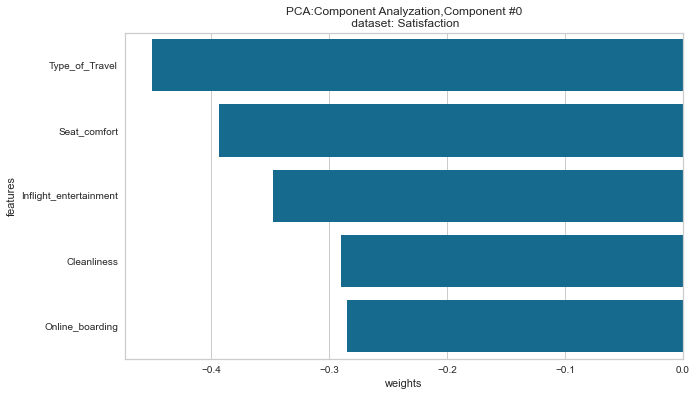

In [127]:
plot_pca(0,5)

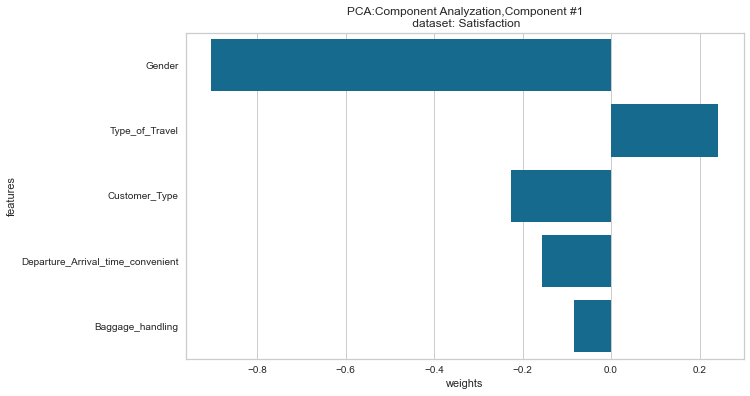

In [128]:
plot_pca(1,5)

In [44]:
def pca(X, cutoff_per, var_threashold):
    pca = PCA(cutoff_per, random_state=7)
    pca.fit(X)
    pca.explained_variance_

    row_index = range(1, pca.explained_variance_.shape[0] + 1)
    ev = pd.Series(data=pca.explained_variance_, index=row_index)
    evr = pd.Series(data=pca.explained_variance_ratio_, index=row_index)
    eigen = pd.Series(data=pca.singular_values_, index=row_index)  
    
    pca_stats_df = pd.DataFrame()
    pca_stats_df['pca_stats_df'] = ev
    pca_stats_df['e-variance-ratio'] = evr
    pca_stats_df['eigen'] = eigen

    var_above = pca_stats_df[pca_stats_df['pca_stats_df'] >= var_threashold]
    #print(pca_stats_df)
    print("Original PCA components")
    print(pca_stats_df)
    print(f"Threshold PCA components variance >= [{var_threashold:.2f}%]")
    print(var_above)
  
    constrained_cols = var_above.index-1
    X_pca_projected = pca.transform(X)

    return pd.DataFrame(X_pca_projected).filter(constrained_cols, axis=1)

In [129]:
print(f"\n---- RUNNING PCA -------")
X_pca_proj_test = pca(X_train, 0.89, 0.1)


---- RUNNING PCA -------
Original PCA components
    pca_stats_df  e-variance-ratio      eigen
1       0.331318          0.174914  72.603536
2       0.252822          0.133473  63.422384
3       0.241717          0.127611  62.013901
4       0.207493          0.109543  57.456239
5       0.164782          0.086994  51.202295
6       0.138053          0.072883  46.865962
7       0.091728          0.048426  38.201967
8       0.079257          0.041843  35.510286
9       0.058281          0.030768  30.450721
10      0.047240          0.024940  27.415213
11      0.042357          0.022362  25.959582
12      0.039466          0.020835  25.057865
Threshold PCA components variance >= [0.10%]
   pca_stats_df  e-variance-ratio      eigen
1      0.331318          0.174914  72.603536
2      0.252822          0.133473  63.422384
3      0.241717          0.127611  62.013901
4      0.207493          0.109543  57.456239
5      0.164782          0.086994  51.202295
6      0.138053          0.072883  46

## ICA

In [36]:
ks = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
def find_ica(ks,X):
    results = []
    for k in ks:
        transformerlarge = FastICA(n_components=k,
                random_state=0)
        X_transformed_large = transformerlarge.fit_transform(X)
        results.append(kurtosis(X_transformed_large))#.mean()
    return results

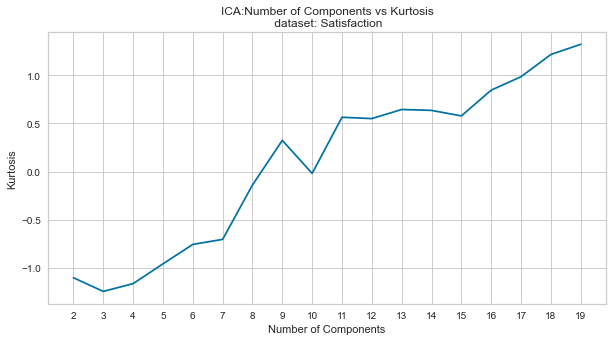

In [37]:
ks = range(2,20)
results = find_ica(ks,X_train)
rs = []
for r in results:
    rs.append(r.mean())
plt.title('ICA:Number of Components vs Kurtosis\n dataset: Satisfaction')
plt.xlabel('Number of Components')
plt.ylabel('Kurtosis')
plt.xticks(range(18),ks)
plt.plot(rs)

In [38]:
should_whiten = True
transformerlarge = FastICA(n_components=11,
                random_state=7, whiten=should_whiten, max_iter=10000)
X_transformed_large = transformerlarge.fit_transform(X_train)


In [39]:
def plot_ica(vector_num,top_comp,transformerlarge=transformerlarge):
    v_1 = transformerlarge.components_[vector_num]
    comps = pd.DataFrame(list(zip(v_1, X.columns.values)), 
                             columns=['weights', 'features'])
    comps['abs_weights']=comps['weights'].apply(lambda x: np.abs(x))
    sorted_weight_data = comps.sort_values('abs_weights', ascending=False).head(top_comp)
    ax=plt.subplots(figsize=(10,6))
    ax=sns.barplot(data=sorted_weight_data, 
                   x="weights", 
                   y="features", 
                   color = "C0",
                   #palette="Blues_d"
                  )
    ax.set_title("ICA Component Makeup, Component #" + str(vector_num) +"\n dataset: Satisfaction")
    plt.show()

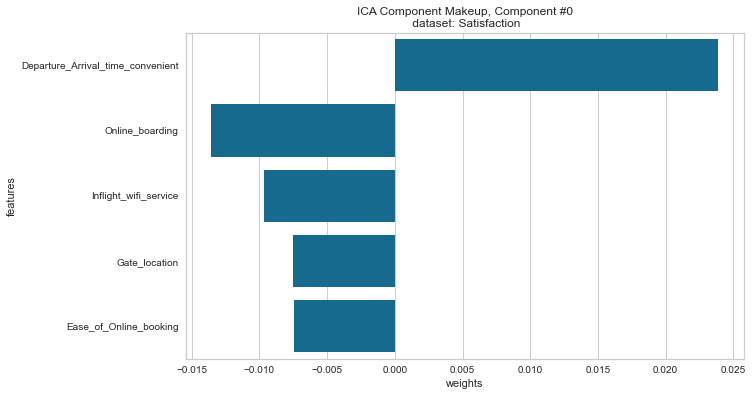

In [40]:
plot_ica(0,5)

In [45]:
def max_kurtosis_indexes(X_projected, cutoff):
    tmp = pd.DataFrame(X_projected)
    tmp = tmp.kurt(axis=0)
    kurt = tmp.sort_values(ascending=False)
        
    max_k = kurt[0:cutoff]
    print(f"Top-{cutoff} Max Kurtosis -- ")
    print(max_k)
    print(max_k.index)
    return max_k.index

In [46]:
def ica_max_kurtosis(X, cutoff, dim=0):

    if dim == 0:
        dim = X.shape[1]-1
    elif dim < cutoff:
        dim = cutoff

    ica = FastICA(random_state=7)
    ica.set_params(n_components=dim)
    X_projected = ica.fit_transform(X)

    max_k_idexes = max_kurtosis_indexes(X_projected,cutoff)
    
    X_proj_df = pd.DataFrame(X_projected)
    X_proj_df  = X_proj_df.filter( max_k_idexes, axis=1 )
        
    return X_proj_df

In [47]:
def ica_research(X, dim, cutoff):
    should_whiten = True
    ica = FastICA(dim, random_state=7, whiten=should_whiten, max_iter=10000)
    S_ = ica.fit_transform(X)
    A_ = ica.mixing_
    C_ = ica.components_
    
    max_k_idexes = max_kurtosis_indexes(S_,cutoff)
    
    mean_ = ica.mean_ if should_whiten else 0
    print(f"X.shape = {X.shape}")
    C_filtered = pd.DataFrame(C_).filter( max_k_idexes, axis=0)
    return A_, C_, C_filtered, mean_

In [140]:
A_ , C_, C_filtered, mean_ = ica_research(X_train, 11, 8)

Top-8 Max Kurtosis -- 
8    3.366445
0    2.269834
7    2.130786
9    2.053776
2    1.080085
4    0.583218
5   -0.411746
1   -0.494945
dtype: float64
Int64Index([8, 0, 7, 9, 2, 4, 5, 1], dtype='int64')
X.shape = (15911, 22)


In [141]:
data_under.columns

Index(['Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction'],
      dtype='object')

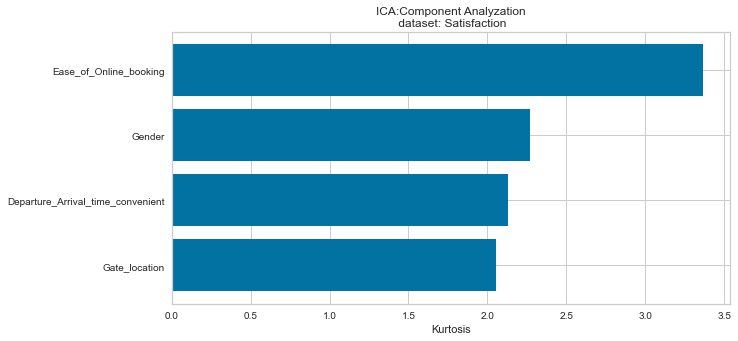

In [143]:
labels = ["Ease_of_Online_booking","Gender","Departure_Arrival_time_convenient", "Gate_location"]
labels.reverse()
data = [2.053776, 2.130786,2.269834,3.366445]

fig, ax = plt.subplots()
b = ax.barh(range(len(labels)), data)

for rect in b:
    w = rect.get_width()
    #ax.text(w, rect.get_y() + rect.get_height()/2, '%d' % int(w), ha='left', va='center')

ax.set_yticks(range(len(labels)))
ax.set_yticklabels(labels)
ax.set_xlabel('Kurtosis')

#plt.xticks(())
plt.title('ICA:Component Analyzation\n dataset: Satisfaction')
plt.show()

Top-4 Max Kurtosis -- 
8    3.366445
0    2.269834
7    2.130786
9    2.053776
dtype: float64
Int64Index([8, 0, 7, 9], dtype='int64')
X.shape = (15911, 22)


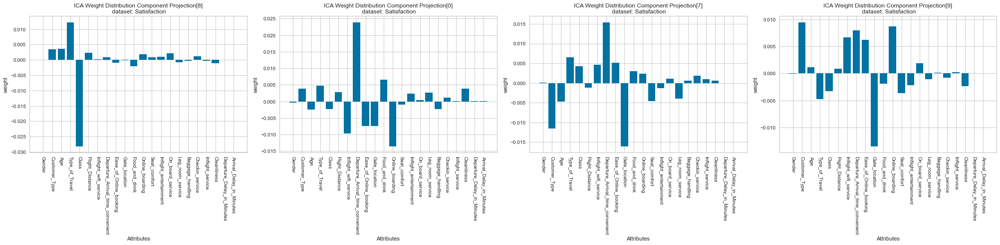

In [161]:
A_ , C_, C_filtered, mean_ = ica_research(X_train, 11, 4)
pd.DataFrame(C_filtered)
def plot_ica_dists(C_df,labels_list):
#     C_df.plot.bar()
   
    r,c = C_df.shape;
    #print (r)
    #print (c)
    #fig, ax_val = plt.subplots(2, r//2, figsize=(3*7,7))
    fig, ax_val = plt.subplots(1, r, figsize=(r*7,7))
    ax = ax_val if type(ax_val) == np.ndarray else [ax_val]
    for i in range(r):
        ax[i].bar( C_df.columns, C_df.iloc[i,:].values)
        ax[i].set_xlabel('Attributes')
        ax[i].set_xticks(C_df.columns)
        ax[i].set_xticklabels(labels_list)
        ax[i].tick_params(axis='x', labelrotation = -90)
        ax[i].set_ylabel('weight')
        ax[i].set_title(f"ICA Weight Distribution Component Projection[{C_df.index[i]}]\n dataset: Satisfaction")
    fig.tight_layout()
    plt.show()

plot_ica_dists(C_filtered, LABELS)


## Randomized Projections

In [148]:
rs = [0, 77, 888, 5678, 98765, 543216, 123456789]
ks = [5,8,10,12,15,18,20]
ks = range(2,21)
def find_rand_proj(ks=ks,X=X):
    results = []
    for k in ks:
        error = 0
        for i in rs:
            gauRP = GaussianRandomProjection(random_state=i,n_components=k)

            gau = gauRP.fit_transform(X)
            
            X_transformed_large = gauRP.fit_transform(X)
            error += mean_squared_error(np.dot(gau,gauRP.components_), X)
        results.append(error/k)
    return results

In [149]:
randp_result = find_rand_proj()

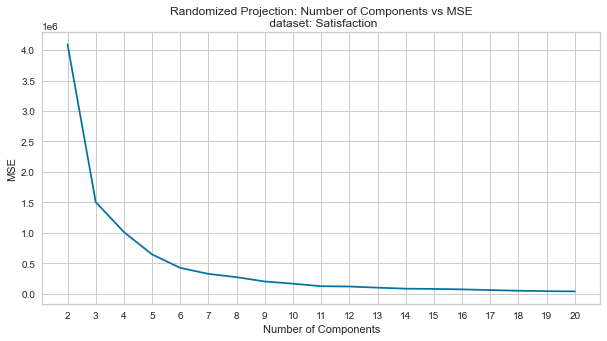

In [150]:
plt.title('Randomized Projection: Number of Components vs MSE\n dataset: Satisfaction')
plt.xlabel('Number of Components')
plt.ylabel('MSE')
plt.xticks(range(len(ks)),ks)
plt.plot(randp_result)

In [49]:
def pairwiseDistCorr(X1,X2):
    assert X1.shape[0] == X2.shape[0]
    
    d1 = pairwise_distances(X1)
    d2 = pairwise_distances(X2)
    return np.corrcoef(d1.ravel(),d2.ravel())[0,1]

def reconstruction_error(projections, x):
    w = projections.components_
    if sps.issparse(w):
        w = w.todense()
    p = pinv(w)
    reconstructed = ((p@w)@(x.T)).T  # Unproject projected data
    
    errors = mean_squared_error(x,reconstructed)

    return np.nanmean(errors)

def rca_research(X, title):
    dims = range(2, X.shape[1] + 1)
    recon_dict = defaultdict(dict)

    #r_states = [89143, 92, 1081244453, 8772, 212]
    #r_states = [0, 77, 888, 5678, 98765, 543216, 123456789]
    #r_states = [888, 5678, 98765, 543216, 123456789]
    r_states = [0, 77, 888, 5678, 98765, 543216, 6789432, 98273615, 123456789, 7]
    i = 0
    for r,dim in product(r_states,dims):
        rp = RCA(random_state=r, n_components=dim)
        rp.fit(X)
        recon_dict[dim][i%len(r_states)] = reconstruction_error(rp, X)
        i += 1
        
    tmp = pd.DataFrame(recon_dict).T
    print(tmp)
    mean_recon_df = tmp.mean(axis=1)
    mean_recon = mean_recon_df.tolist()
    std_recon = tmp.std(axis=1).tolist()
    
    print("*** reconstruction MSE***")
    print(mean_recon_df)
    


    fig, ax1 = plt.subplots()
    ax1.plot(dims,mean_recon, 'C0-')
    ax1.set_xlabel('Number of Components')
    # Make the y-axis label, ticks and tick labels match the line color.
    ax1.set_ylabel('Mean Reconstruction Error', color='C0')
    ax1.tick_params('y', colors='C0')
    plt.grid(False)

    ax2 = ax1.twinx()
    ax2.plot(dims,std_recon, linestyle='--', color='darkorange', linewidth=0.75)
    ax2.set_ylabel('STD Reconstruction Error', color='darkorange' )
    ax2.tick_params('y', colors='darkorange')
    plt.grid(False)

    plt.title("Random Components: 10 Restarts \n"+ title)
    fig.tight_layout()
    plt.show()

In [50]:
def rp(X, dim, r_state=7):
    rp = RCA(random_state=r_state, n_components=dim)
    fitted = rp.fit(X)
    X_rca_projected = rp.transform(X)
    return pd.DataFrame(X_rca_projected)

               0             1             2             3         4  \
2   3.639782e-01  3.433651e-01  4.167120e-01  4.133280e-01  0.373891   
3   4.040065e-01  3.602068e-01  3.339483e-01  3.879210e-01  0.359204   
4   3.244596e-01  2.751081e-01  3.078705e-01  3.526590e-01  0.374139   
5   2.984848e-01  3.309211e-01  3.296266e-01  2.992144e-01  0.346225   
6   3.478517e-01  3.495702e-01  3.081839e-01  2.327774e-01  0.225891   
7   3.045286e-01  2.275179e-01  1.981373e-01  2.536304e-01  0.260007   
8   2.998167e-01  2.891930e-01  1.922315e-01  3.201792e-01  0.338662   
9   2.243401e-01  1.668163e-01  3.622597e-01  2.069015e-01  0.225962   
10  2.583946e-01  1.844460e-01  1.199195e-01  2.671707e-01  0.178245   
11  2.096593e-01  2.000180e-01  1.377819e-01  9.746096e-02  0.181259   
12  2.148784e-01  1.522484e-01  1.764063e-01  1.293492e-01  0.245392   
13  1.347695e-01  1.281606e-01  7.419469e-02  1.310009e-01  0.264065   
14  1.074171e-01  2.343079e-01  1.197305e-01  2.259115e-01  0.14

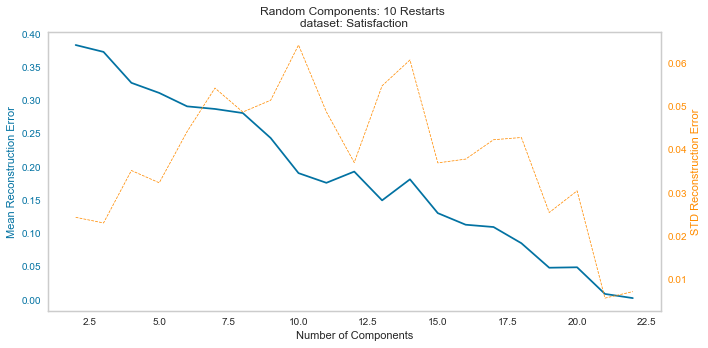

In [153]:
rca_research(X_train, 'dataset: Satisfaction')

               0             1         2             3             4
2   4.167120e-01  4.133280e-01  0.373891  3.650753e-01  4.105080e-01
3   4.044462e-01  3.879210e-01  0.359204  3.521790e-01  3.763237e-01
4   3.413033e-01  3.244596e-01  0.374139  2.823960e-01  3.267070e-01
5   2.906184e-01  2.432151e-01  0.330921  3.202629e-01  2.978642e-01
6   3.008093e-01  2.951822e-01  0.269862  3.081839e-01  2.548046e-01
7   2.963473e-01  3.370637e-01  0.367270  3.045286e-01  2.536304e-01
8   3.386617e-01  2.717243e-01  0.286167  2.998167e-01  2.891930e-01
9   3.622597e-01  2.459191e-01  0.245505  2.243401e-01  1.668163e-01
10  1.199195e-01  2.671707e-01  0.135137  2.583946e-01  1.844460e-01
11  1.377819e-01  9.746096e-02  0.181259  1.367092e-01  2.000180e-01
12  1.764063e-01  1.293492e-01  0.245392  1.570477e-01  2.237934e-01
13  2.069527e-01  1.310009e-01  0.264065  1.771526e-01  1.206501e-01
14  1.113059e-01  1.074171e-01  0.144659  1.975898e-01  2.416546e-01
15  1.162523e-01  1.668391e-01  0.

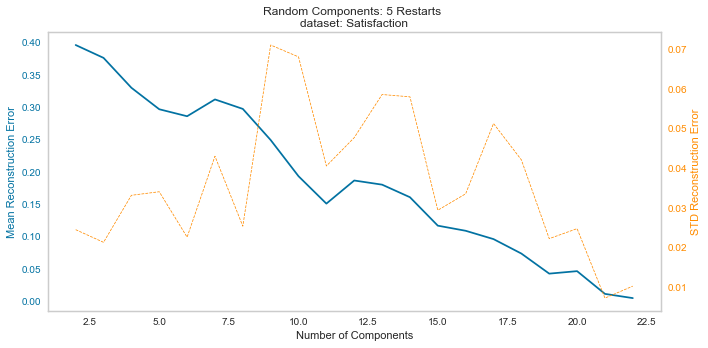

In [154]:
def rca_research_2(X, title):
    dims = range(2, X.shape[1] + 1)
    recon_dict = defaultdict(dict)

    #r_states = [89143, 92, 1081244453, 8772, 212]
    #r_states = [0, 77, 888, 5678, 98765, 543216, 123456789]
    r_states = [888, 5678, 98765, 543216, 123456789]
    #r_states = [0, 77, 888, 5678, 98765, 543216, 6789432, 98273615, 123456789, 7]
    i = 0
    for r,dim in product(r_states,dims):
        rp = RCA(random_state=r, n_components=dim)
        rp.fit(X)
        recon_dict[dim][i%len(r_states)] = reconstruction_error(rp, X)
        i += 1
        
    tmp = pd.DataFrame(recon_dict).T
    print(tmp)
    mean_recon_df = tmp.mean(axis=1)
    mean_recon = mean_recon_df.tolist()
    std_recon = tmp.std(axis=1).tolist()
    
    print("*** reconstruction MSE***")
    print(mean_recon_df)
    


    fig, ax1 = plt.subplots()
    ax1.plot(dims,mean_recon, 'C0-')
    ax1.set_xlabel('Number of Components')
    # Make the y-axis label, ticks and tick labels match the line color.
    ax1.set_ylabel('Mean Reconstruction Error', color='C0')
    ax1.tick_params('y', colors='C0')
    plt.grid(False)

    ax2 = ax1.twinx()
    ax2.plot(dims,std_recon, linestyle='--', color='darkorange', linewidth=0.75)
    ax2.set_ylabel('STD Reconstruction Error', color='darkorange' )
    ax2.tick_params('y', colors='darkorange')
    plt.grid(False)

    plt.title("Random Components: 5 Restarts \n"+ title)
    fig.tight_layout()
    plt.show()
def rp_2(X, dim, r_state=7):
    rp_2 = RCA(random_state=r_state, n_components=dim)
    fitted = rp.fit(X)
    X_rca_projected = rp.transform(X)
    return pd.DataFrame(X_rca_projected)

rca_research_2(X_train, 'dataset: Satisfaction')


## Random Forest

In [155]:
clf = RandomForestClassifier(n_estimators=100, random_state=7)
clf.fit(X_train, y_train)
tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_importance_sorted_idx
clf.feature_importances_[tree_importance_sorted_idx[-7:]]

array([0.0443846 , 0.04575479, 0.05258839, 0.0663548 , 0.10872407,
       0.13333287, 0.18954394])

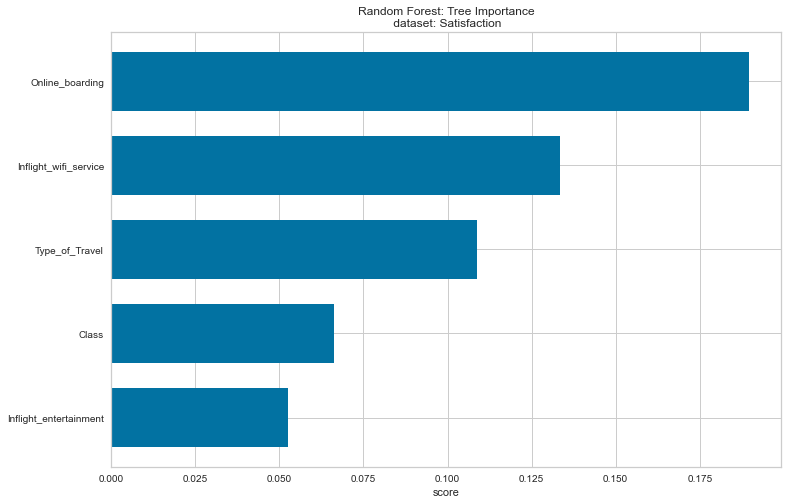

In [156]:
tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5

fig, ax1 = plt.subplots(1, 1, figsize=(12, 8))

ax1.barh(tree_indices[-5:],
         clf.feature_importances_[tree_importance_sorted_idx[-5:]], height=0.7)
ax1.set_yticklabels(X.columns[tree_importance_sorted_idx][-5:])
ax1.set_yticks(tree_indices[-5:])
ax1.set_xlabel('score')
plt.title('Random Forest: Tree Importance\n dataset: Satisfaction')
plt.show()

In [48]:
def rfc_research(X,y):
                 
        rfc = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=7, n_jobs=-1)
        fs = rfc.fit(X,y).feature_importances_
        return fs
        
def rfc(X,y):
                 
        rfc = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=7, n_jobs=-1)
        fs = rfc.fit(X,y).feature_importances_
        indexes_found = np.where(fs >= 0.1)
        #print("index:",indexes_found[0])
        
        X_reduced = pd.DataFrame(X)
        #print("X_reduced",X_reduced)
        filter_columns = [list(X_reduced.columns)[i] for i in indexes_found[0]] 
        #print(filter_columns)
        X_reduced = X_reduced.filter(filter_columns, axis=1)
        #print(X_reduced)
        
        return X_reduced

In [132]:
#Research for Random Forest
important = rfc_research(X_train, y_train)
important_df = pd.DataFrame(columns=LABELS)
df_length = len(important_df)
important_df.loc[df_length] = important
print("*** importance ***:")
print(pd.Series(important))

print(rfc(X_train, y_train))

*** importance ***:
0     0.006123
1     0.029425
2     0.034907
3     0.096176
4     0.072691
5     0.042984
6     0.138825
7     0.019843
8     0.042166
9     0.015736
10    0.013229
11    0.190122
12    0.050120
13    0.056878
14    0.025756
15    0.039393
16    0.020959
17    0.027003
18    0.023558
19    0.025811
20    0.013332
21    0.014963
dtype: float64
        6    11
0      0.6  0.6
1      0.8  0.6
2      0.8  1.0
3      0.4  0.2
4      0.4  0.4
...    ...  ...
15906  0.2  0.2
15907  1.0  1.0
15908  0.6  0.4
15909  0.2  0.2
15910  0.0  0.0

[15911 rows x 2 columns]


In [133]:
print(f"\n---- RUNNING Random Forest RFC -------")
X_rfc_proj = rfc(X_train,y_train)


---- RUNNING Random Forest RFC -------


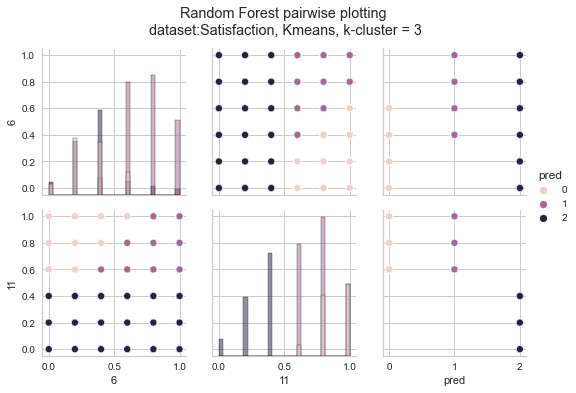

In [139]:
plot_km_pairwise(X_rfc_proj, 3, 'Random Forest pairwise plotting\n dataset:Satisfaction')

# Projections

In [51]:
print(f"\n---- RUNNING PCA -------")
X_pca_proj = pca(X_train, 0.89, 0.1)

print(f"---- RUNNING ICA -------")
X_ica_proj = ica_max_kurtosis(X_train ,4, dim=11)

print(f"\n---- RUNNING RP -------")
r_states = [0, 77, 888, 5678, 98765, 543216, 6789432, 98273615, 123456789, 7]
X_rp_proj = []
for r in r_states:
    X_rp = rp(X_train, 7, r)
    X_rp_proj.append(X_rp)

print(f"\n---- RUNNING Random Forest RFC -------")
X_rfc_proj = rfc(X_train,y_train)

print(f"Shapes for rfc: {X_rfc_proj.shape} ")


---- RUNNING PCA -------
Original PCA components
    pca_stats_df  e-variance-ratio      eigen
1       0.331318          0.174914  72.603536
2       0.252822          0.133473  63.422384
3       0.241717          0.127611  62.013901
4       0.207493          0.109543  57.456239
5       0.164782          0.086994  51.202295
6       0.138053          0.072883  46.865962
7       0.091728          0.048426  38.201967
8       0.079257          0.041843  35.510286
9       0.058281          0.030768  30.450721
10      0.047240          0.024940  27.415213
11      0.042357          0.022362  25.959582
12      0.039466          0.020835  25.057865
Threshold PCA components variance >= [0.10%]
   pca_stats_df  e-variance-ratio      eigen
1      0.331318          0.174914  72.603536
2      0.252822          0.133473  63.422384
3      0.241717          0.127611  62.013901
4      0.207493          0.109543  57.456239
5      0.164782          0.086994  51.202295
6      0.138053          0.072883  46

## Kmeans with Projections

In [163]:
print("Starting PCA scores")
scores_df_pca = get_kmean_scores(X_pca_proj, y_train, 10)

print("Starting ICA score")
scores_df_ica = get_kmean_scores(X_ica_proj, y_train, 10)

scores_df_rp = []
for i in range(len(X_rp_proj)):
    print(f"Starting RP scores [{i}]")
    scores_df_rp.append(get_kmean_scores(X_rp_proj[i], y_train, 10))
    
print("Starting RFC scores")
scores_df_rfc = get_kmean_scores(X_rfc_proj,  y_train, 10)

Starting PCA scores
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting ICA score
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [0]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [1]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [2]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [3]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10

In [164]:
def merge_scores_df_list(scores_df_list):
    scores_all_df = pd.DataFrame(scores_df_list[0])
    for i in range(1,len(scores_df_list)):
        scores_all_df += scores_df_list[i]
    
    scores_all_df = scores_all_df / len(scores_df_list)
    return scores_all_df

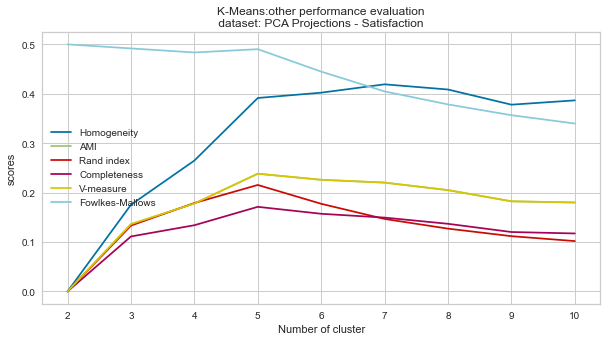

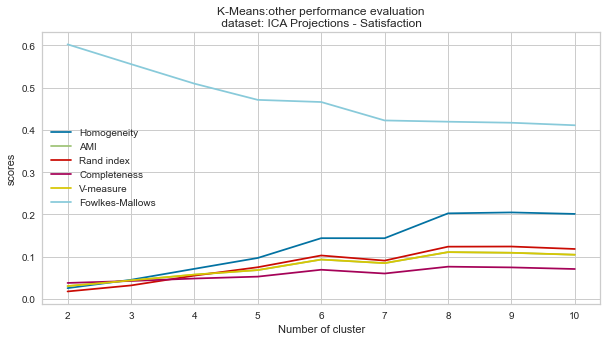

(9, 7), (9, 7)


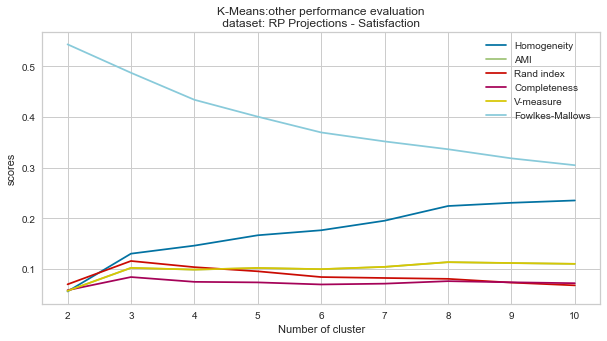

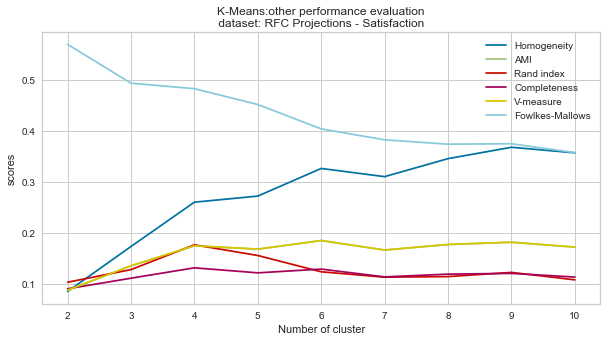

In [165]:
plot_elbow_kmeans(scores_df_pca, 'PCA Projections - Satisfaction')

plot_elbow_kmeans(scores_df_ica, 'ICA Projections - Satisfaction')

scores_all_df_rp = merge_scores_df_list(scores_df_rp)
print(f"{scores_all_df_rp.shape}, {scores_df_rp[0].shape}")
plot_elbow_kmeans(scores_all_df_rp, 'RP Projections - Satisfaction')

plot_elbow_kmeans(scores_df_rfc, 'RFC Projections - Satisfaction')


In [53]:
def plot_km_pairwise(X, N, title):
    
    km = KMeans(n_clusters=N,random_state=7, max_iter=10000)
    km.fit(X)
    pred_clusters = km.predict(X)


    filtred_df = X.copy()  
    x_vars = filtred_df.columns     
    filtred_df['pred'] = pred_clusters  
    y_vars = filtred_df.columns[0:2]
    #print("y_vars:",y_vars)
    
    ax = sns.PairGrid(filtred_df, hue="pred", x_vars=x_vars, y_vars=y_vars)
    #label_list = ["SSLfinal_State", "Request_URL", "Domain_registeration_length", "web_traffic", "age_of_domain", "URL_of_Anchor"]
    #ax.set_xticklabels(label_list)
    ax.map_diag(sns.histplot)
    ax.map_offdiag(sns.scatterplot)
    ax.add_legend()
    ax.fig.suptitle("%s, Kmeans, k-cluster = %d"%(title,N), y=1.08)

### PCA

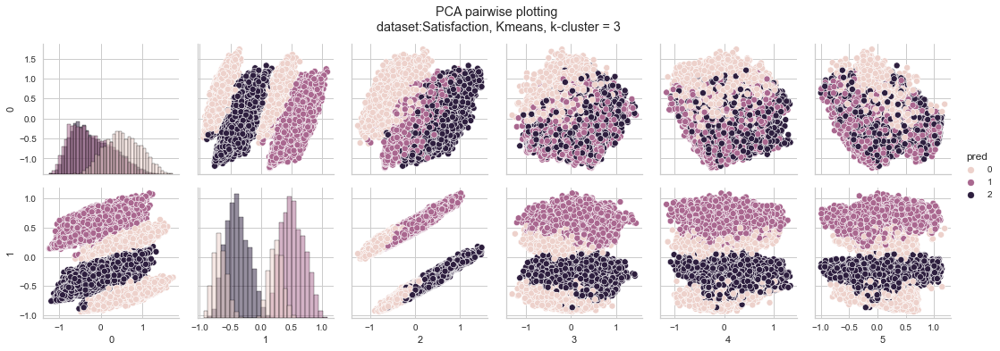

In [167]:
plot_km_pairwise(X_pca_proj, 3, 'PCA pairwise plotting\n dataset:Satisfaction')

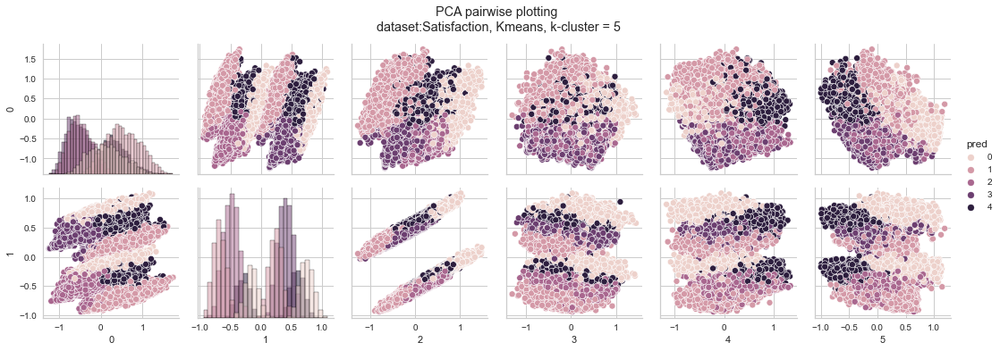

In [54]:
plot_km_pairwise(X_pca_proj, 5, 'PCA pairwise plotting\n dataset:Satisfaction')

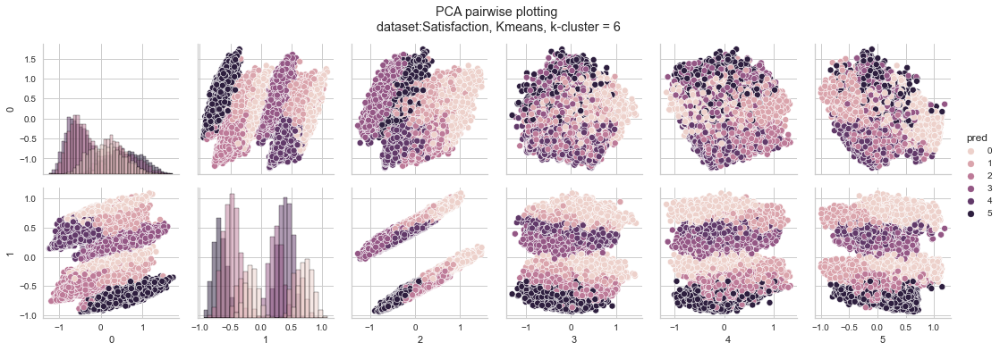

In [189]:
plot_km_pairwise(X_pca_proj, 6, 'PCA pairwise plotting\n dataset:Satisfaction')

### ICA

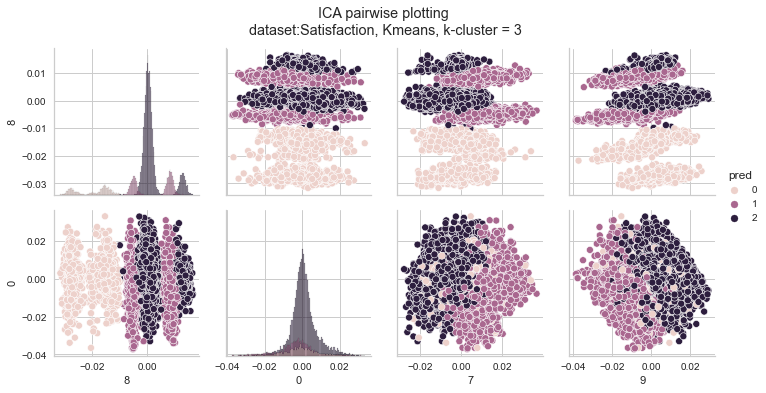

In [168]:
plot_km_pairwise(X_ica_proj, 3, 'ICA pairwise plotting\n dataset:Satisfaction')

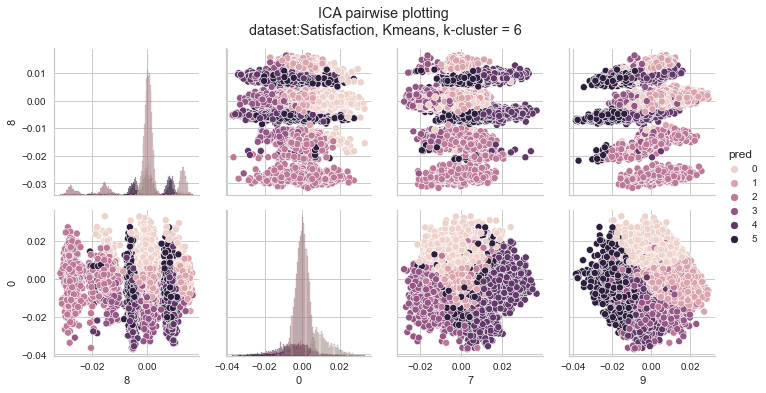

In [190]:
plot_km_pairwise(X_ica_proj, 6, 'ICA pairwise plotting\n dataset:Satisfaction')

### RP

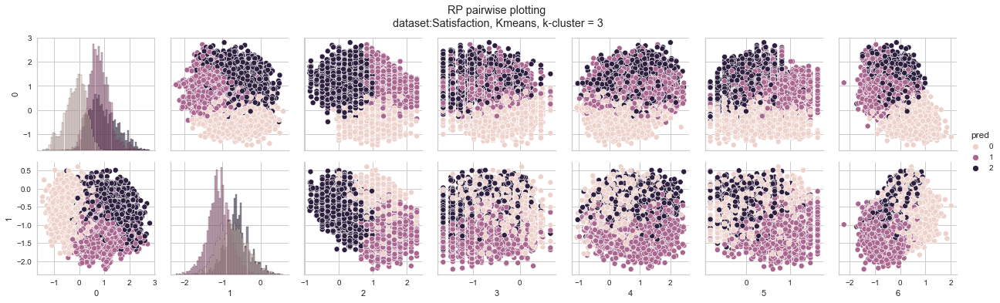

In [169]:
plot_km_pairwise(X_rp_proj[1], 3, 'RP pairwise plotting\n dataset:Satisfaction')

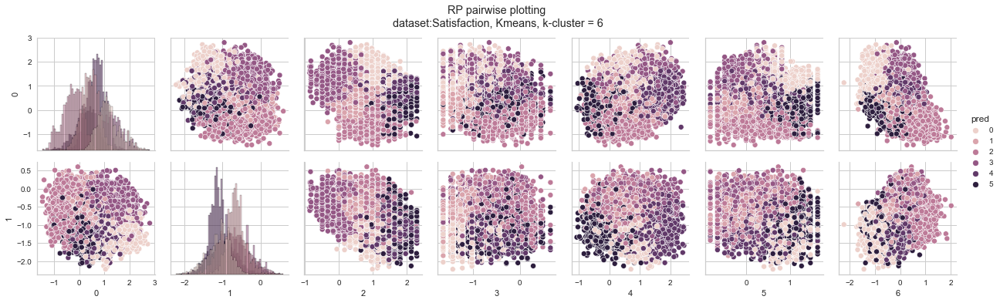

In [191]:
plot_km_pairwise(X_rp_proj[1], 6, 'RP pairwise plotting\n dataset:Satisfaction')

### RFC

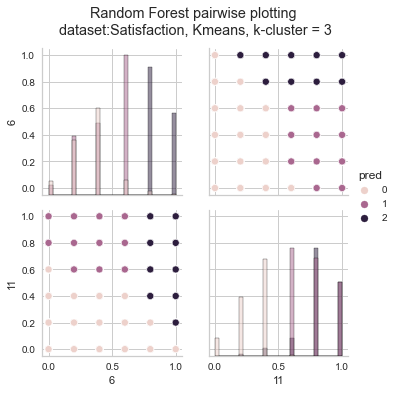

In [187]:
plot_km_pairwise(X_rfc_proj, 3, 'Random Forest pairwise plotting\n dataset:Satisfaction')

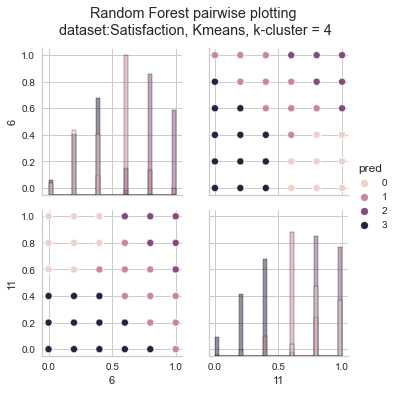

In [198]:
plot_km_pairwise(X_rfc_proj, 4, 'Random Forest pairwise plotting\n dataset:Satisfaction')

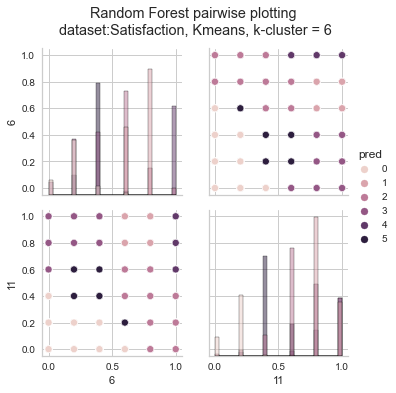

In [192]:
plot_km_pairwise(X_rfc_proj, 6, 'Random Forest pairwise plotting\n dataset:Satisfaction')

## EM with Projections

In [193]:
print("Starting PCA scores")
scores_df_pca = get_em_scores(X_pca_proj, y_train, 10)

print("Starting ICA scores")
scores_df_ica = get_em_scores(X_ica_proj, y_train, 10)

scores_df_rp = []
for i in range(len(X_rp_proj)):
    print(f"Starting RP scores [{i}]")
    scores_df_rp.append(get_em_scores(X_rp_proj[i], y_train, 10))
print("Starting RFC scores")
scores_df_rfc = get_em_scores(X_rfc_proj, y_train, 10)

Starting PCA scores
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting ICA scores
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [0]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [1]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [2]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [3]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 1

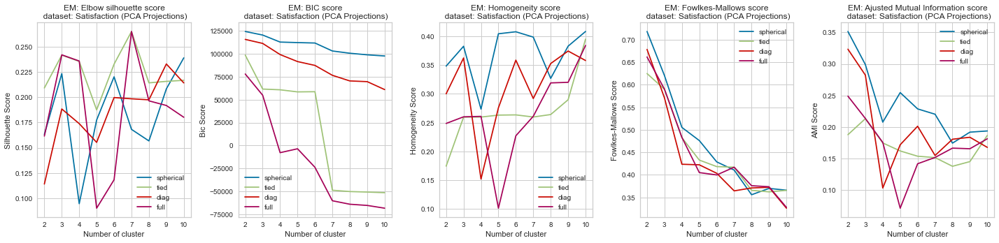

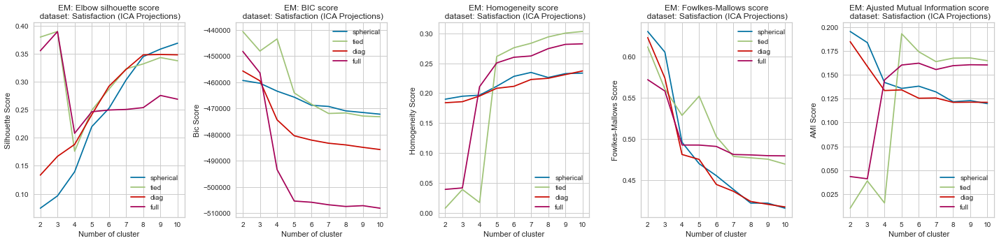

(9, 21), (9, 21)


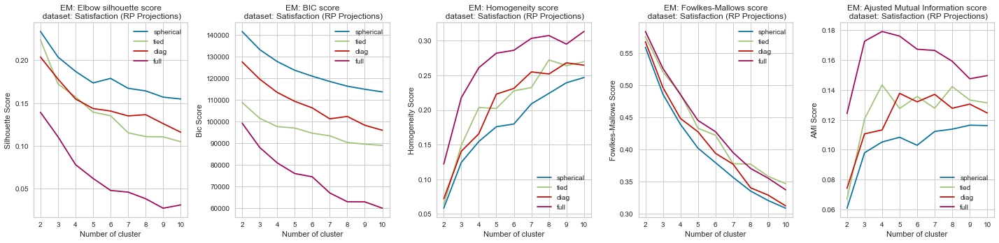

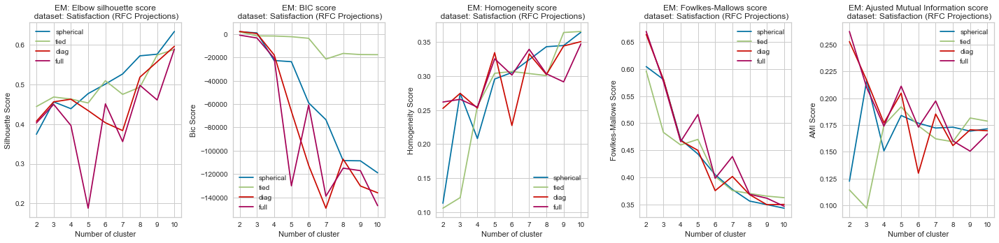

In [194]:
plot_elbow_em(scores_df_pca, 'Satisfaction (PCA Projections)')#, face_color='#FF8C00')

plot_elbow_em(scores_df_ica, 'Satisfaction (ICA Projections)')#, face_color='#ffffd4')

scores_all_df_rp = merge_scores_df_list(scores_df_rp)
print(f"{scores_all_df_rp.shape}, {scores_df_rp[0].shape}")
plot_elbow_em(scores_all_df_rp, 'Satisfaction (RP Projections)')#, face_color='#f6cefc')

plot_elbow_em(scores_df_rfc, 'Satisfaction (RFC Projections)')#, face_color='#cafffb')


In [55]:
def plot_em_pairwise(X, N, cv_type, title):
    
    gmm = GMM(n_components=N, covariance_type=cv_type, random_state=7)
    gmm.fit(X)
    pred_clusters = gmm.predict(X)


    filtred_df = pd.DataFrame(X)
 
    x_vars = filtred_df.columns    
    filtred_df['pred'] = pred_clusters

    y_vars = filtred_df.columns[0:2]
    ax = sns.PairGrid(filtred_df, hue="pred", x_vars=x_vars, y_vars=y_vars)
    ax.map_diag(sns.histplot)
    ax.map_offdiag(sns.scatterplot)
    ax.add_legend()
    ax.fig.suptitle("%s, EM, k-cluster = %d"%(title,N), y=1.08)

### PCA

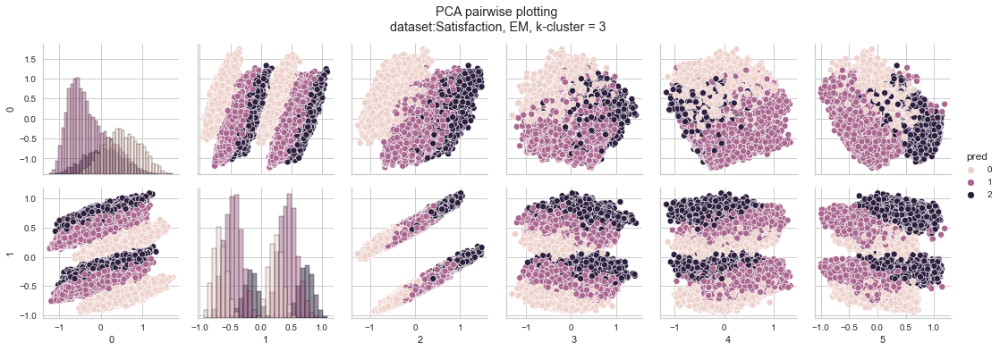

In [56]:
plot_em_pairwise(X_pca_proj, 3, 'tied','PCA pairwise plotting\n dataset:Satisfaction')

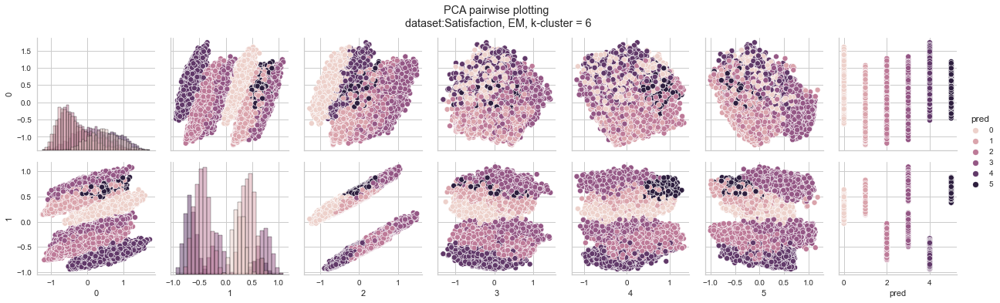

In [57]:
plot_em_pairwise(X_pca_proj, 6, 'tied','PCA pairwise plotting\n dataset:Satisfaction')

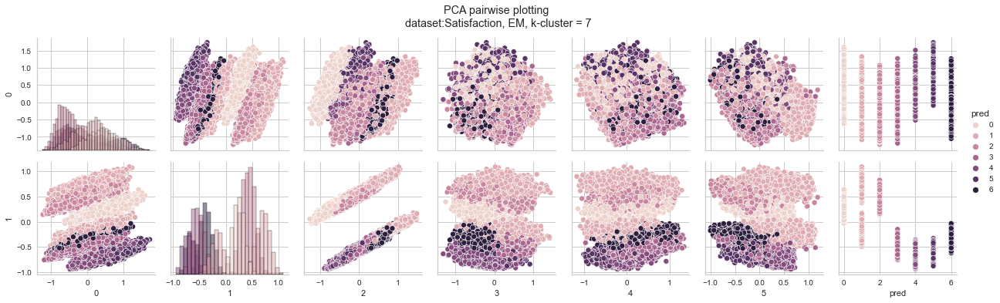

In [204]:
plot_em_pairwise(X_pca_proj, 7, 'tied','PCA pairwise plotting\n dataset:Satisfaction')

### ICA

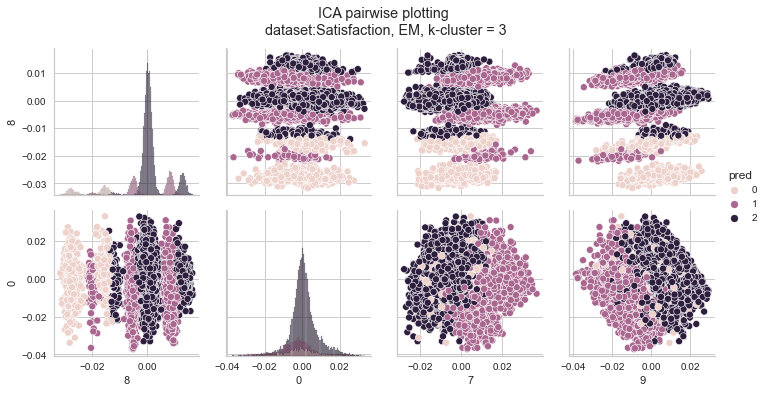

In [205]:
plot_em_pairwise(X_ica_proj, 3, 'tied','ICA pairwise plotting\n dataset:Satisfaction')

### RP

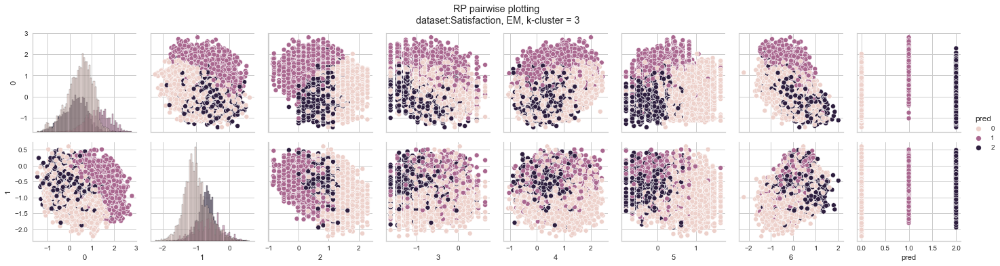

In [207]:
plot_em_pairwise(X_rp_proj[1], 3, 'tied','RP pairwise plotting\n dataset:Satisfaction')

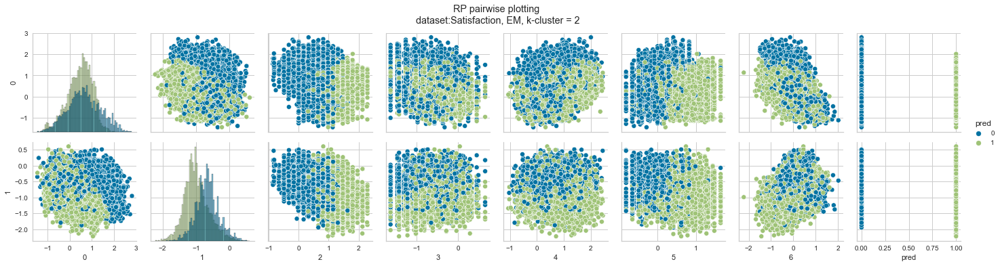

In [208]:
plot_em_pairwise(X_rp_proj[1], 2, 'tied','RP pairwise plotting\n dataset:Satisfaction')

### RFC

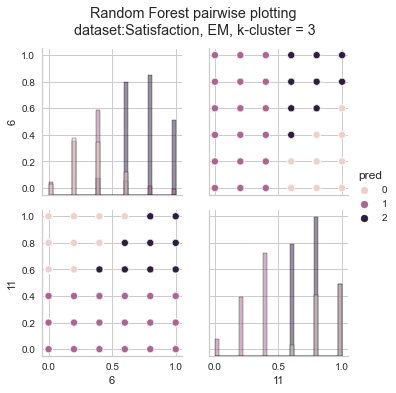

In [209]:
plot_em_pairwise(X_rfc_proj, 3, 'tied','Random Forest pairwise plotting\n dataset:Satisfaction')

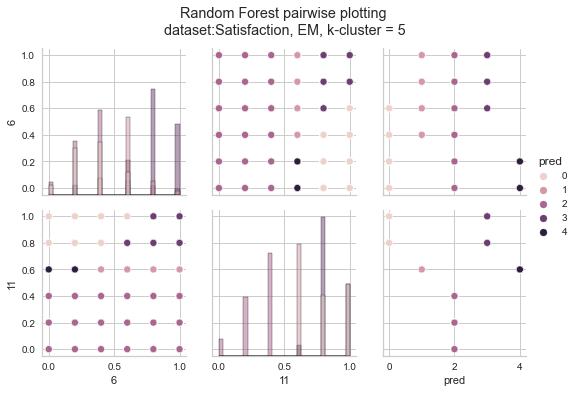

In [210]:
plot_em_pairwise(X_rfc_proj, 5, 'tied','Random Forest pairwise plotting\n dataset:Satisfaction')